<a href="https://colab.research.google.com/github/bala-codes/Yolo-v5_Object_Detection_Blood_Cell_Count_and_Detection/blob/master/codes/1.%20Yolo-V5%20BCC%20Training%20%26%20Testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## reference
- https://towardsdatascience.com/yolo-v3-object-detection-53fb7d3bfe6b

In [1]:
# !git clone 'https://github.com/Shenggan/BCCD_Dataset.git'

Cloning into 'BCCD_Dataset'...
remote: Enumerating objects: 800, done.
remote: Total 800 (delta 0), reused 0 (delta 0), pack-reused 800
Receiving objects: 100% (800/800), 7.39 MiB | 36.90 MiB/s, done.
Resolving deltas: 100% (378/378), done.


#**DATA PRE-PROCESSING STARTS**

# Extraction of data labels from .xml file to dataframe

In [1]:
import shutil
import os, sys, random
import xml.etree.ElementTree as ET
from glob import glob
import pandas as pd
from shutil import copyfile
import pandas as pd
from sklearn import preprocessing, model_selection
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import patches
import numpy as np
import os

In [2]:
! ls ../

BCCD_Dataset		 data-preprocecced		    Inference_files
BCCD_Dataset-master.zip  dataset-preprocessed_original.zip  LICENSE
codes			 imgs				    README.md


In [3]:
annotations = sorted(glob('../BCCD_Dataset/BCCD/Annotations/*.xml'))
annotations

['../BCCD_Dataset/BCCD/Annotations/BloodImage_00000.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00001.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00002.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00003.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00004.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00005.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00006.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00007.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00008.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00009.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00010.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00011.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00012.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00013.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00014.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00015.xml',
 '../BCCD_Dataset/BCCD/Annotations/BloodImage_00016.xml',
 '../BCCD_Data

In [4]:
df = []
cnt = 0
for file in annotations:
  prev_filename = file.split('/')[-1].split('.')[0] + '.jpg'
  filename = str(cnt) + '.jpg'
  row = []
  parsedXML = ET.parse(file)
  for node in parsedXML.getroot().iter('object'):
    blood_cells = node.find('name').text
    xmin = int(node.find('bndbox/xmin').text)
    xmax = int(node.find('bndbox/xmax').text)
    ymin = int(node.find('bndbox/ymin').text)
    ymax = int(node.find('bndbox/ymax').text)

    row = [prev_filename, filename, blood_cells, xmin, xmax, ymin, ymax]
    df.append(row)
  cnt += 1

data = pd.DataFrame(df, columns=['prev_filename', 'filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax'])

data[['prev_filename','filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax']].to_csv('./blood_cell_detection.csv', index=False)

# Processing data as per the YOLO_V5 format

**DATAFRAME STRUCTURE**

- filename : contains the name of the image
- cell_type: denotes the type of the cell
- xmin: x-coordinate of the bottom left part of the image
- xmax: x-coordinate of the top right part of the image
- ymin: y-coordinate of the bottom left part of the image
- ymax: y-coordinate of the top right part of the image
- labels : Encoded cell-type **(Yolo - label input-1)**
- width : width of that bbox
- height : height of that bbox
- x_center : bbox center (x-axis)
-	y_center : bbox center (y-axis)
-	x_center_norm	: x_center normalized (0-1) **(Yolo - label input-2)**
-	y_center_norm : y_center normalized (0-1) **(Yolo - label input-3)**
- width_norm : width normalized (0-1) **(Yolo - label input-4)**
-	height_norm : height normalized (0-1) **(Yolo - label input-5)**

In [5]:
img_width = 640
img_height = 480

def width(df):
  return int(df.xmax - df.xmin)
def height(df):
  return int(df.ymax - df.ymin)
def x_center(df):
  return int(df.xmin + (df.width/2))
def y_center(df):
  return int(df.ymin + (df.height/2))
def w_norm(df):
  return df/img_width
def h_norm(df):
  return df/img_height

df = pd.read_csv('./blood_cell_detection.csv')

In [6]:
df.head()

,prev_filename,filename,cell_type,xmin,xmax,ymin,ymax
0,BloodImage_00000.jpg,0.jpg,WBC,260,491,177,376
1,BloodImage_00000.jpg,0.jpg,RBC,78,184,336,435
2,BloodImage_00000.jpg,0.jpg,RBC,63,169,237,336
3,BloodImage_00000.jpg,0.jpg,RBC,214,320,362,461
4,BloodImage_00000.jpg,0.jpg,RBC,414,506,352,445


In [7]:
le = preprocessing.LabelEncoder()
le.fit(df['cell_type'])
print(le.classes_)
labels = le.transform(df['cell_type']) #categorize
df['labels'] = labels

df['width'] = df.apply(width, axis=1)
df['height'] = df.apply(height, axis=1)

df['x_center'] = df.apply(x_center, axis=1)
df['y_center'] = df.apply(y_center, axis=1)

df['x_center_norm'] = df['x_center'].apply(w_norm) #/img_width
df['width_norm'] = df['width'].apply(w_norm)

df['y_center_norm'] = df['y_center'].apply(h_norm)
df['height_norm'] = df['height'].apply(h_norm)

df.head(30)

['Platelets' 'RBC' 'WBC']


,prev_filename,filename,cell_type,xmin,xmax,ymin,ymax,labels,width,height,x_center,y_center,x_center_norm,width_norm,y_center_norm,height_norm
0,BloodImage_00000.jpg,0.jpg,WBC,260,491,177,376,2,231,199,375,276,0.585938,0.360938,0.575000,0.414583
1,BloodImage_00000.jpg,0.jpg,RBC,78,184,336,435,1,106,99,131,385,0.204687,0.165625,0.802083,0.206250
2,BloodImage_00000.jpg,0.jpg,RBC,63,169,237,336,1,106,99,116,286,0.181250,0.165625,0.595833,0.206250
3,BloodImage_00000.jpg,0.jpg,RBC,214,320,362,461,1,106,99,267,411,0.417187,0.165625,0.856250,0.206250
4,BloodImage_00000.jpg,0.jpg,RBC,414,506,352,445,1,92,93,460,398,0.718750,0.143750,0.829167,0.193750
5,BloodImage_00000.jpg,0.jpg,RBC,555,640,356,455,1,85,99,597,405,0.932813,0.132812,0.843750,0.206250
6,BloodImage_00000.jpg,0.jpg,RBC,469,567,412,480,1,98,68,518,446,0.809375,0.153125,0.929167,0.141667
7,BloodImage_00000.jpg,0.jpg,RBC,1,87,333,437,1,86,104,44,385,0.068750,0.134375,0.802083,0.216667
8,BloodImage_00000.jpg,0.jpg,RBC,4,95,406,480,1,91,74,49,443,0.076563,0.142187,0.922917,0.154167
9,BloodImage_00000.jpg,0.jpg,RBC,155,247,74,174,1,92,100,201,124,0.314063,0.143750,0.258333,0.208333


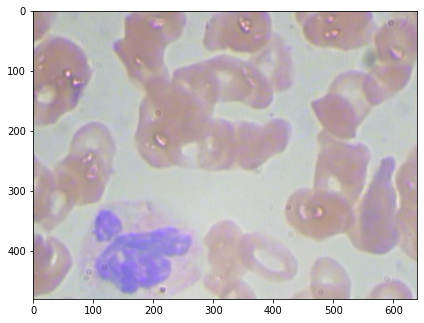

In [8]:
#@title SAMPLE PLOT - shape (480, 640, 3)
fig = plt.figure()
import cv2
#add axes to the image
ax = fig.add_axes([0,0,1,1])

# read and plot the image
image = plt.imread('../BCCD_Dataset/BCCD/JPEGImages/BloodImage_00001.jpg')
plt.imshow(image)

In [9]:
for _,row in df[df.filename == "1.jpg"].iterrows():
#     print(_)
    print(row)

prev_filename    BloodImage_00001.jpg
filename                        1.jpg
cell_type                         WBC
xmin                               68
xmax                              286
ymin                              315
ymax                              480
labels                              2
width                             218
height                            165
x_center                          177
y_center                          397
x_center_norm                0.276562
width_norm                   0.340625
y_center_norm                0.827083
height_norm                   0.34375
Name: 20, dtype: object
prev_filename    BloodImage_00001.jpg
filename                        1.jpg
cell_type                         RBC
xmin                              346
xmax                              446
ymin                              361
ymax                              454
labels                              1
width                             100
height                    

In [20]:
# iterating over the image for different objects
for _,row in df[df.filename == "1.jpg"].iterrows():
    xmin = row.xmin
    xmax = row.xmax
    ymin = row.ymin
    ymax = row.ymax
    
    width = xmax - xmin
    height = ymax - ymin
    
    # assign different color to different classes of objects
    if row.cell_type == 'RBC':
        edgecolor = 'r'
        ax.annotate('RBC', xy=(xmax-40,ymin+20))
    elif row.cell_type == 'WBC':
        edgecolor = 'b'
        ax.annotate('WBC', xy=(xmax-40,ymin+20))
    elif row.cell_type == 'Platelets':
        edgecolor = 'g'
        ax.annotate('Platelets', xy=(xmax-40,ymin+20))
        
    # add bounding boxes to the image
    rect = patches.Rectangle((xmin,ymin), width, height, edgecolor = edgecolor, facecolor = 'none')
    
    ax.add_patch(rect)

# Splitting into training and validation datasets

In [21]:
df_train, df_valid = model_selection.train_test_split(df, test_size=0.1, random_state=13, shuffle=True)
print(df_train.shape, df_valid.shape)

(4399, 16) (489, 16)


In [22]:
! ls ../

BCCD_Dataset		 data-preprocecced		    Inference_files
BCCD_Dataset-master.zip  dataset-preprocessed_original.zip  LICENSE
codes			 imgs				    README.md


In [23]:
os.mkdir('../data-preprocecced')
os.mkdir('../data-preprocecced/bcc/')
os.mkdir('../data-preprocecced/bcc/images/')
os.mkdir('../data-preprocecced/bcc/images/train/')
os.mkdir('../data-preprocecced/bcc/images/valid/')

os.mkdir('../data-preprocecced/bcc/labels/')
os.mkdir('../data-preprocecced/bcc/labels/train/')
os.mkdir('../data-preprocecced/bcc/labels/valid/')

FileExistsError: [Errno 17] File exists: '../data-preprocecced'

# Data segregation and moving to it's corresponding folders
- BCC
  - Images
    - Train (364 images [.jpg files])
    - Valid (270 images [.jpg files])
  - Labels
    - Train (364 labels [.txt files])
    - Valid (270 labels [.txt files])


**STRUCTURE OF .txt FILE**

- One row per object
- Each row is class x_center y_center width height format.
- Box coordinates must be in normalized xywh format (from 0 - 1). If your boxes  are in pixels, divide x_center and width by image width, and y_center and height by image height.
- Class numbers are zero-indexed (start from 0).


<img src="https://github.com/bala-codes/Yolo-v5_Object_Detection_Blood_Cell_Count_and_Detection/blob/master/imgs/label_txt.PNG?raw=true" width="50%">


In [28]:
def segregate_data(df, img_path, label_path, train_img_path, train_label_path):
  filenames = []
  for filename in df.filename:
    filenames.append(filename)
  filenames = set(filenames)
  
  for filename in filenames:
    yolo_list = []

    for _,row in df[df.filename == filename].iterrows():
      yolo_list.append([row.labels, row.x_center_norm, row.y_center_norm, row.width_norm, row.height_norm])

    yolo_list = np.array(yolo_list)
    print("yolo_list[:3]:",yolo_list[:3])
    txt_filename = os.path.join(train_label_path,str(row.prev_filename.split('.')[0])+".txt")
    print(txt_filename)
    # Save the .img & .txt files to the corresponding train and validation folders
    np.savetxt(txt_filename, yolo_list, fmt=["%d", "%f", "%f", "%f", "%f"])
    shutil.copyfile(os.path.join(img_path,row.prev_filename), os.path.join(train_img_path,row.prev_filename))

In [30]:
%%time
src_img_path = "../BCCD_Dataset/BCCD/JPEGImages/"
src_label_path = "../BCCD_Dataset/BCCD/Annotations/"

train_img_path = "../data-preprocecced/bcc/images/train"
train_label_path = "../data-preprocecced/bcc/labels/train"

valid_img_path = "../data-preprocecced/bcc/images/valid"
valid_label_path = "../data-preprocecced/bcc/labels/valid"

segregate_data(df_train, src_img_path, src_label_path, train_img_path, train_label_path)
segregate_data(df_valid, src_img_path, src_label_path, valid_img_path, valid_label_path)

yolo_list[:3]: [[1.         0.5703125  0.62916667 0.1828125  0.22916667]
 [1.         0.728125   0.21041667 0.203125   0.2375    ]
 [1.         0.1765625  0.31875    0.1796875  0.25      ]]
../data-preprocecced/bcc/labels/train/BloodImage_00340.txt
yolo_list[:3]: [[1.         0.6765625  0.25416667 0.1640625  0.2875    ]
 [2.         0.4875     0.67083333 0.38125    0.46458333]
 [0.         0.9328125  0.90833333 0.0640625  0.07916667]]
../data-preprocecced/bcc/labels/train/BloodImage_00236.txt
yolo_list[:3]: [[1.         0.5078125  0.22291667 0.171875   0.21041667]
 [1.         0.38125    0.42291667 0.16875    0.20833333]
 [1.         0.8296875  0.11875    0.1375     0.17083333]]
../data-preprocecced/bcc/labels/train/BloodImage_00069.txt
yolo_list[:3]: [[1.         0.4015625  0.23958333 0.1609375  0.26458333]
 [1.         0.171875   0.38125    0.1546875  0.21875   ]
 [1.         0.86875    0.22291667 0.16875    0.20833333]]
../data-preprocecced/bcc/labels/train/BloodImage_00097.txt
yolo

yolo_list[:3]: [[1.         0.796875   0.57291667 0.1390625  0.18541667]
 [1.         0.4796875  0.625      0.1359375  0.21666667]
 [2.         0.4890625  0.16875    0.26875    0.29791667]]
../data-preprocecced/bcc/labels/train/BloodImage_00137.txt
yolo_list[:3]: [[0.         0.55       0.58958333 0.0546875  0.06458333]
 [1.         0.4265625  0.64583333 0.1875     0.23958333]
 [2.         0.3671875  0.27708333 0.3390625  0.3875    ]]
../data-preprocecced/bcc/labels/train/BloodImage_00003.txt
yolo_list[:3]: [[1.         0.26875    0.34166667 0.178125   0.23541667]
 [1.         0.671875   0.875      0.184375   0.25      ]
 [1.         0.40625    0.48333333 0.175      0.22916667]]
../data-preprocecced/bcc/labels/train/BloodImage_00351.txt
yolo_list[:3]: [[1.         0.0640625  0.6875     0.1265625  0.25833333]
 [1.         0.675      0.25208333 0.1734375  0.25416667]
 [2.         0.434375   0.7        0.3703125  0.4625    ]]
../data-preprocecced/bcc/labels/train/BloodImage_00318.txt
yolo

yolo_list[:3]: [[1.         0.0796875  0.10625    0.15625    0.20208333]
 [1.         0.659375   0.37291667 0.1921875  0.22916667]
 [2.         0.4984375  0.77708333 0.3578125  0.44375   ]]
../data-preprocecced/bcc/labels/train/BloodImage_00260.txt
yolo_list[:3]: [[1.         0.05625    0.43958333 0.1109375  0.17916667]
 [1.         0.75       0.27916667 0.165625   0.19583333]
 [1.         0.7453125  0.65208333 0.184375   0.22291667]]
../data-preprocecced/bcc/labels/train/BloodImage_00311.txt
yolo_list[:3]: [[1.         0.6203125  0.17083333 0.1609375  0.23333333]
 [1.         0.2921875  0.1        0.1671875  0.19583333]
 [1.         0.828125   0.28958333 0.1421875  0.20208333]]
../data-preprocecced/bcc/labels/train/BloodImage_00001.txt
yolo_list[:3]: [[0.         0.1765625  0.72083333 0.05       0.07916667]
 [1.         0.90625    0.25208333 0.178125   0.21875   ]
 [2.         0.375      0.4125     0.278125   0.33541667]]
../data-preprocecced/bcc/labels/train/BloodImage_00016.txt
yolo

yolo_list[:3]: [[1.         0.2375     0.88333333 0.14375    0.15416667]
 [1.         0.9203125  0.91875    0.1578125  0.1625    ]
 [1.         0.7546875  0.66666667 0.16875    0.25625   ]]
../data-preprocecced/bcc/labels/train/BloodImage_00396.txt
yolo_list[:3]: [[1.         0.6671875  0.59791667 0.1578125  0.22291667]
 [1.         0.9078125  0.49375    0.15625    0.2125    ]
 [1.         0.5328125  0.08958333 0.1625     0.17708333]]
../data-preprocecced/bcc/labels/train/BloodImage_00176.txt
yolo_list[:3]: [[1.         0.7875     0.41458333 0.1375     0.22291667]
 [1.         0.590625   0.61458333 0.140625   0.19583333]
 [1.         0.5296875  0.90208333 0.140625   0.19583333]]
../data-preprocecced/bcc/labels/train/BloodImage_00092.txt
yolo_list[:3]: [[1.         0.4015625  0.28541667 0.13125    0.20833333]
 [1.         0.7671875  0.73125    0.175      0.20416667]
 [1.         0.515625   0.18958333 0.159375   0.225     ]]
../data-preprocecced/bcc/labels/train/BloodImage_00017.txt
yolo

yolo_list[:3]: [[1.         0.7765625  0.86041667 0.1640625  0.20625   ]
 [1.         0.5453125  0.20208333 0.14375    0.18333333]
 [1.         0.4671875  0.15625    0.140625   0.19583333]]
../data-preprocecced/bcc/labels/train/BloodImage_00320.txt
yolo_list[:3]: [[1.         0.8953125  0.19791667 0.1296875  0.19583333]
 [1.         0.7203125  0.775      0.1609375  0.23958333]
 [1.         0.6625     0.40833333 0.1609375  0.19375   ]]
../data-preprocecced/bcc/labels/train/BloodImage_00019.txt
yolo_list[:3]: [[1.         0.6578125  0.34375    0.15       0.25      ]
 [1.         0.2171875  0.74166667 0.2        0.23333333]
 [1.         0.1015625  0.06875    0.1796875  0.13333333]]
../data-preprocecced/bcc/labels/train/BloodImage_00171.txt
yolo_list[:3]: [[2.         0.515625   0.52916667 0.2359375  0.27916667]
 [1.         0.5171875  0.73125    0.1671875  0.21458333]
 [1.         0.865625   0.46041667 0.1671875  0.21458333]]
../data-preprocecced/bcc/labels/train/BloodImage_00148.txt
yolo

yolo_list[:3]: [[1.         0.7015625  0.92708333 0.2078125  0.13541667]]
../data-preprocecced/bcc/labels/valid/BloodImage_00344.txt
yolo_list[:3]: [[1.         0.3171875  0.2375     0.2015625  0.22708333]
 [1.         0.7625     0.72291667 0.1984375  0.23125   ]
 [2.         0.3890625  0.63958333 0.1859375  0.2625    ]]
../data-preprocecced/bcc/labels/valid/BloodImage_00305.txt
yolo_list[:3]: [[1.         0.1484375  0.27916667 0.1578125  0.19166667]]
../data-preprocecced/bcc/labels/valid/BloodImage_00260.txt
yolo_list[:3]: [[2.         0.790625   0.54375    0.221875   0.28125   ]
 [1.         0.51875    0.73958333 0.1359375  0.18333333]]
../data-preprocecced/bcc/labels/valid/BloodImage_00066.txt
yolo_list[:3]: [[1.        0.4421875 0.40625   0.159375  0.1875   ]]
../data-preprocecced/bcc/labels/valid/BloodImage_00064.txt
yolo_list[:3]: [[1.         0.5046875  0.825      0.1421875  0.22708333]
 [1.         0.7765625  0.69791667 0.1359375  0.16666667]
 [1.         0.7875     0.35833333 

In [31]:
try:
  shutil.rmtree('../data-preprocecced/bcc/images/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('../data-preprocecced/bcc/images/valid/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('../data-preprocecced/bcc/labels/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('../data-preprocecced/bcc/labels/valid/.ipynb_checkpoints')
except FileNotFoundError:
  pass

print("No. of Training images", len(os.listdir('../data-preprocecced/bcc/images/train')))
print("No. of Training labels", len(os.listdir('../data-preprocecced/bcc/labels/train')))

print("No. of valid images", len(os.listdir('../data-preprocecced/bcc/images/valid')))
print("No. of valid labels", len(os.listdir('../data-preprocecced/bcc/labels/valid')))

No. of Training images 364
No. of Training labels 364
No. of valid images 270
No. of valid labels 270


# **END OF DATA PRE-PROCESSING**

#**YOLO V5 STARTS**

In [7]:
# !cp -r '/content/bcc' '/content/drive/My Drive/Machine Learning Projects/YOLO/'

cp: cannot stat '/content/bcc': No such file or directory


# Cloning from the yolo v5 repo.
More can be found at here : [yolo](https://github.com/ultralytics/yolov5)

In [11]:
# !git clone  'https://github.com/ultralytics/yolov5.git'
## I downloaded as a zip file

Cloning into 'yolov5'...
remote: Enumerating objects: 14, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 2154 (delta 4), reused 9 (delta 4), pack-reused 2140
Receiving objects: 100% (2154/2154), 7.57 MiB | 30.50 MiB/s, done.
Resolving deltas: 100% (1403/1403), done.


In [12]:
!pip install -qr '/content/yolov5/requirements.txt'  # install dependencies

     |████████████████████████████████| 276kB 5.5MB/s 


# WE SHOULD CREATE A .yaml FILE AND THEN PLACE IT INSIDE THE yolov5 FOLDER

#**Contents of YAML file**

train: /content/bcc/images/train                    
val: /content/bcc/images/valid

nc: 3

names: ['Platelets', 'RBC', 'WBC']


<img src="https://github.com/bala-codes/Yolo-v5_Object_Detection_Blood_Cell_Count_and_Detection/blob/master/imgs/bcc_yaml.PNG?raw=true" width="50%">



In [33]:
shutil.copyfile('./bcc.yaml', '../yolov5/bcc.yaml')

'../yolov5/bcc.yaml'

#**Also edit the number of classes (nc) in the ./models/*.yaml file**

Choose the yolo model of your choice, here I chose yolov5s.yaml (yolo - small)


<img src="https://cdn-images-1.medium.com/max/600/1*hCE5VwKkqHlZW466umYTTA.png">

# Training command

**Training Parameters**

!python 
- <'location of train.py file'> 
- --img <'width of image'>
- --batch <'batch size'>
- --epochs <'no of epochs'>
- --data <'location of the .yaml file'>
- --cfg <'Which yolo configuration you want'>(yolov5s/yolov5m/yolov5l/yolov5x).yaml | (small, medium, large, xlarge)
- --name <'Name of the best model after training'>

**METRICS FROM TRAINING PROCESS**

**No.of classes, No.of images, No.of targets, Precision (P), Recall (R), mean Average Precision (map)**
- Class | Images | Targets | P | R | mAP@.5 | mAP@.5:.95: |
- all   | 270    |     489 |    0.0899 |       0.827 |      0.0879 |      0.0551

In [65]:
%%time

!python train.py --img 640 --batch 8 --epochs 100 --data bcc.yaml --cfg models/yolov5s.yaml --name BCCM

Using CUDA device0 _CudaDeviceProperties(name='GeForce RTX 2060', total_memory=5931MB)

Namespace(adam=False, batch_size=8, bucket='', cache_images=False, cfg='models/yolov5s.yaml', data='bcc.yaml', device='', epochs=100, evolve=False, global_rank=-1, hyp='data/hyp.finetune.yaml', img_size=[640, 640], local_rank=-1, logdir='runs/', multi_scale=False, name='BCCM', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=8, weights='yolov5s.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'momentum': 0.94, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.4, 'cls_pw': 1.0, 'obj': 0.5, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 1.0, 'translate': 0.1, 'scale': 0.6, 'shear': 1.0, 'perspective': 0.0, 'flipud': 0.01, 'fliplr': 0.5, 'mixup': 0.2}
Overriding models

     10/99     2.52G    0.0475   0.08504  0.005027    0.1376        52       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489       0.039       0.988       0.121      0.0619

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     11/99     2.52G    0.0504   0.09391  0.004803    0.1491       113       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489      0.0474       0.981       0.122      0.0638

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     12/99     2.52G   0.04642   0.09021  0.004493    0.1411        92       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489      0.0418       0.949       0.107      0.0462

     Epoch   gpu_mem      GIoU       obj       cls     total   targets

               Class      Images     Targets           P           R      mAP@.5
                 all         270         489      0.0955       0.891       0.122      0.0776

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     35/99     2.52G   0.03435   0.08653  0.002139     0.123       190       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489      0.0887       0.971       0.126      0.0771

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     36/99     2.52G    0.0361   0.08889  0.002179    0.1272       107       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489       0.094       0.943       0.124      0.0787

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     37/99     2.52G   0.03412   0.08663  0.001967    0.1227        90


     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     59/99     2.52G   0.02912   0.07723  0.001447    0.1078       114       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489      0.0948       0.929       0.116      0.0746

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     60/99     2.52G   0.02883   0.07877  0.001455    0.1091        76       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489       0.096       0.925        0.12      0.0778

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     61/99     2.52G   0.02902   0.08331  0.001411    0.1137       128       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489      0.0926       0.926       0.114  

     83/99     2.52G   0.02836   0.07993  0.001371    0.1097       126       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489      0.0927       0.933       0.108      0.0705

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     84/99     2.52G   0.02743   0.07732  0.001038    0.1058       123       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489      0.0955       0.937       0.104      0.0676

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     85/99     2.52G   0.02764   0.07546  0.001184    0.1043       171       640
               Class      Images     Targets           P           R      mAP@.5
                 all         270         489      0.0958         0.9       0.103      0.0658

     Epoch   gpu_mem      GIoU       obj       cls     total   targets

In [66]:
# Start tensorboard (optional)
%load_ext tensorboard
%tensorboard --logdir runs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


#**INFERENCE**

In [ ]:
#Optimizer stripped from runs/exp2_BCCM/weights/last_BCCM.pt, 14.8MB
#Optimizer stripped from runs/exp2_BCCM/weights/best_BCCM.pt, 14.8MB

# BATCH PREDICTION
- Results saved to inference/output


**Inference Parameters**

!python 
- <'location of detect.py file'> 
- --source <'location of image/ folder to predict'>
- --weight <'location of the saved best weights'>
- --output <'location of output files after prediction'>

In [80]:
!python detect.py --source ../data-preprocessed/bcc/images/valid/ --weights './runs/exp5_BCCM/weights/best_BCCM.pt' --output 'inference/output'

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='../data-preprocessed/bcc/images/valid/', update=False, view_img=False, weights=['./runs/exp5_BCCM/weights/best_BCCM.pt'])
Using CUDA device0 _CudaDeviceProperties(name='GeForce RTX 2060', total_memory=5931MB)

Fusing layers... 
Model Summary: 140 layers, 7.25191e+06 parameters, 6.61683e+06 gradients
image 1/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00000.jpg: 512x640 17 RBCs, 1 WBCs, Done. (0.010s)
image 2/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00001.jpg: 512x640 20 RBCs, 1 WBCs, Done. (0.009s)
image 3/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00002.jpg: 512x640 19 RBCs, 1 WBCs,

image 42/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00049.jpg: 512x640 1 Plateletss, 14 RBCs, 1 WBCs, Done. (0.009s)
image 43/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00050.jpg: 512x640 11 RBCs, 1 WBCs, Done. (0.009s)
image 44/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00052.jpg: 512x640 2 Plateletss, 17 RBCs, 1 WBCs, Done. (0.010s)
image 45/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00054.jpg: 512x640 16 RBCs, 1 WBCs, Done. (0.009s)
image 46/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00055.jpg: 512x640 3 Plateletss, 11 RBCs, 1 WBCs, Done. (0.008s)
image 47/270 /home/dayoung/dev/Yolo-V5

image 85/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00117.jpg: 512x640 2 Plateletss, 11 RBCs, 1 WBCs, Done. (0.008s)
image 86/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00120.jpg: 512x640 11 RBCs, 1 WBCs, Done. (0.008s)
image 87/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00123.jpg: 512x640 1 Plateletss, 13 RBCs, 1 WBCs, Done. (0.008s)
image 88/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00124.jpg: 512x640 1 Plateletss, 14 RBCs, 1 WBCs, Done. (0.008s)
image 89/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00125.jpg: 512x640 2 Plateletss, 11 RBCs, 1 WBCs, Done. (0.008s)
image 90/270 /home/dayou

image 130/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00203.jpg: 512x640 2 Plateletss, 20 RBCs, 1 WBCs, Done. (0.008s)
image 131/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00204.jpg: 512x640 2 Plateletss, 14 RBCs, 1 WBCs, Done. (0.008s)
image 132/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00206.jpg: 512x640 2 Plateletss, 16 RBCs, 1 WBCs, Done. (0.008s)
image 133/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00208.jpg: 512x640 1 Plateletss, 19 RBCs, 1 WBCs, Done. (0.008s)
image 134/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00210.jpg: 512x640 2 Plateletss, 10 RBCs, 1 WBCs, Done. (0.008s)
image

image 174/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00269.jpg: 512x640 1 Plateletss, 14 RBCs, 1 WBCs, Done. (0.008s)
image 175/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00272.jpg: 512x640 18 RBCs, 1 WBCs, Done. (0.008s)
image 176/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00273.jpg: 512x640 2 Plateletss, 16 RBCs, 1 WBCs, Done. (0.008s)
image 177/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00274.jpg: 512x640 1 Plateletss, 11 RBCs, 1 WBCs, Done. (0.008s)
image 178/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00275.jpg: 512x640 2 Plateletss, 18 RBCs, 1 WBCs, Done. (0.008s)
image 179/270 /home

image 218/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00336.jpg: 512x640 16 RBCs, 1 WBCs, Done. (0.008s)
image 219/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00339.jpg: 512x640 2 Plateletss, 19 RBCs, 1 WBCs, Done. (0.008s)
image 220/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00340.jpg: 512x640 1 Plateletss, 18 RBCs, 1 WBCs, Done. (0.008s)
image 221/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00341.jpg: 512x640 16 RBCs, 1 WBCs, Done. (0.008s)
image 222/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00342.jpg: 512x640 17 RBCs, 1 WBCs, Done. (0.008s)
image 223/270 /home/dayoung/dev/Yolo-V5_Object_

image 261/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00392.jpg: 512x640 1 Plateletss, 16 RBCs, 1 WBCs, Done. (0.008s)
image 262/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00395.jpg: 512x640 2 Plateletss, 18 RBCs, 1 WBCs, Done. (0.008s)
image 263/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00397.jpg: 512x640 24 RBCs, 1 WBCs, Done. (0.008s)
image 264/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00400.jpg: 512x640 15 RBCs, 1 WBCs, Done. (0.008s)
image 265/270 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00402.jpg: 512x640 1 Plateletss, 18 RBCs, 1 WBCs, Done. (0.008s)
image 266/270 /home/dayoung/dev/Y

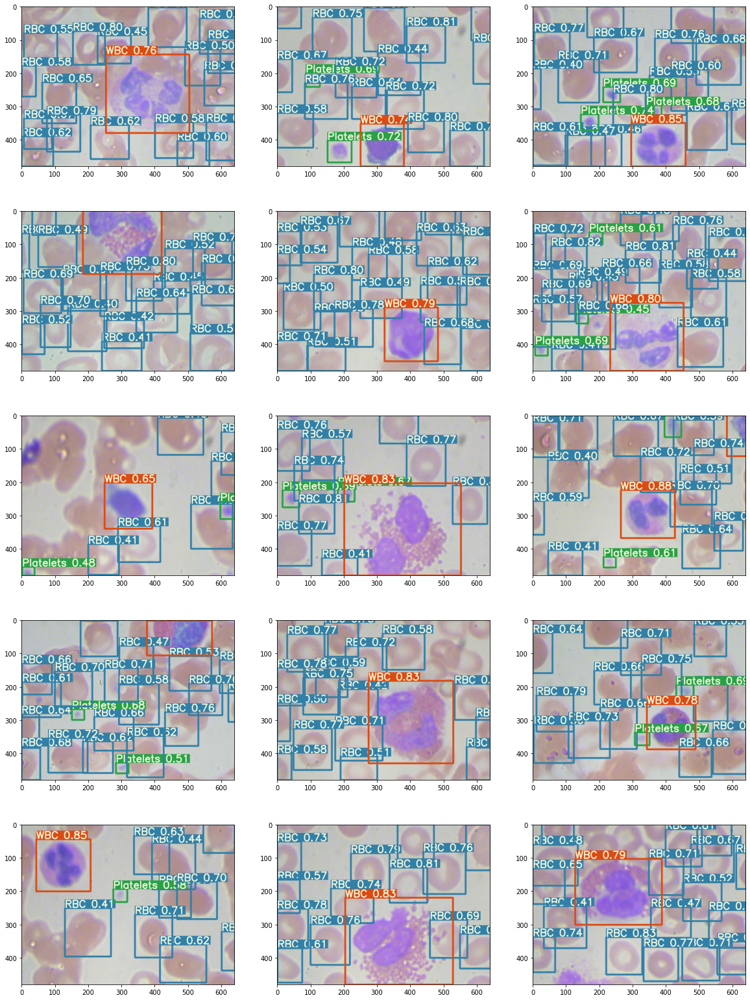

In [81]:
disp_images = glob('inference/output/*')
fig=plt.figure(figsize=(20, 28))
columns = 3
rows = 5
for i in range(1, columns*rows +1):
    img = np.random.choice(disp_images)
    img = plt.imread(img)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

# SINGLE IMAGE PREDICTIONS


In [90]:
output = !python detect.py --source ../data-preprocessed/bcc/images/valid/BloodImage_00000.jpg --weights './runs/exp5_BCCM/weights/best_BCCM.pt' --output 'inference/single_output'
print(output)

["Using CUDA device0 _CudaDeviceProperties(name='GeForce RTX 2060', total_memory=5931MB)", '', 'Model Summary: 140 layers, 7.25191e+06 parameters, 6.61683e+06 gradients', "Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/single_output', save_txt=False, source='../data-preprocessed/bcc/images/valid/BloodImage_00000.jpg', update=False, view_img=False, weights=['./runs/exp5_BCCM/weights/best_BCCM.pt'])", 'Fusing layers... ', 'image 1/1 /home/dayoung/dev/Yolo-V5_Object_Detection_Blood_Cell_Count_and_Detection/data-preprocessed/bcc/images/valid/BloodImage_00000.jpg: 512x640 17 RBCs, 1 WBCs, Done. (0.009s)', 'Results saved to inference/single_output', 'Done. (0.031s)']


['inference/single_output/BloodImage_00000.jpg']


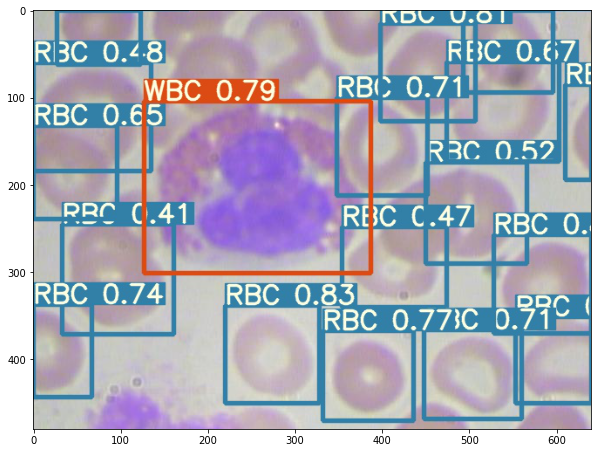

In [94]:
disp_images = glob('inference/single_output/*')
print(disp_images)
fig=plt.figure(figsize=(10, 18))
plt.imread(disp_images[0])
plt.imshow(img)

# You need these files, if you wish to move the model to production

## Files

In [27]:
shutil.copyfile('/content/yolov5/detect.py', '/content/drive/My Drive/Machine Learning Projects/YOLO/SOURCE/detect.py')
shutil.copyfile('/content/yolov5/requirements.txt', '/content/drive/My Drive/Machine Learning Projects/YOLO/SOURCE/requirements.txt')
shutil.copyfile('/content/runs/exp2_BCCM/weights/best_BCCM.pt', '/content/drive/My Drive/Machine Learning Projects/YOLO/SOURCE/best_BCCM.pt')



## Folder

In [ ]:
!cp -r '/content/yolov5/models' '/content/drive/My Drive/Machine Learning Projects/YOLO/SOURCE/'
!cp -r '/content/yolov5/utils' '/content/drive/My Drive/Machine Learning Projects/YOLO/SOURCE/'
